# A Convolotion Neural Network for Indian Coin Classification.

### Research Question:

In this notebook we are trying to **develop a Convolution Neural Network(CNN)** from scratch that can effectivly **classify indian coins by their denomination.** The aim is simple take an image of a indian coin and ouput a text label based on the denomination of the coin. 

The data used for training contains images of One (1), Two (2), Five (5), Ten (10), and Twenty (20) Rupee coins in Indian denomination and their variations that are in circulation as of December 2021. In total there are 900 Images that will be used for training and testing.

### Dataset and License information.

The Dataset used in this project comes under a Creative Common License (CC BY 4.0) - [License Information](https://creativecommons.org/licenses/by/4.0/).

For more information on **Data** used in this study and for **Citations**, refer the github repository description - [Here](www.github.com)

**Note:** This notebook and model was developed in a Google Colaboratory Environment (You can read about Google Colaboratory -  [Here](https://colab.research.google.com/?utm_source=scs-index))

# Model Building
## Mounting Drive and Unzipping Data

In [1]:
#Mounting Drive
from google.colab import drive
drive.mount('/content/drive')

#Unzipping Dataset
!unzip "/content/drive/MyDrive/Papers/Indian Coin Denomination Classification/dataset.zip" -d "/content"

In [2]:
#Function to pretty print the directory structure
import os
def list_files(startpath):
  for root, dirs, files in os.walk(startpath):
    level = root.replace(startpath, '').count(os.sep)
    indent = ' ' * 4 * (level)
    print('{}{}/'.format(indent, os.path.basename(root)))
    subindent = ' ' * 4 * (level + 1)

list_files('dataset')

dataset/
    test_set/
        five/
        one/
        ten/
        twenty/
        two/
    training_set/
        five/
        one/
        ten/
        twenty/
        two/


### Importing Required Libraries

In [3]:
#Libraries set up

#Visualization
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline

#Data Augmentation
from keras.preprocessing.image import ImageDataGenerator

#CNN Architecture
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPool2D
from keras.layers import Flatten, GlobalAvgPool2D
from keras.layers import Dense
from tensorflow.keras.optimizers import Adam

## Pre-Processing and Data Augmentation

**1. Pixel Scaling:**

Image normalization is used to scale the pixel intensities from (0 - 255) to (0 - 1) for each of the three channels of RGB.

**2. Resizing:**

Image resizing is reuired to reduce the size of the image(if the size is larger than necessary) and also to keep the size same for all image input images.

**3. Data Augmentation:**

While developing a CNN a huge amount of data is required to get sufficient results, this is a common bottleneck for performance of many models. \
To tackle the problem of scracity of data, **Data Augmentation** techniques are used that generates new images from the given images by using various transformation. Some transformation used are given below:

1. Random Roation
2. Random Brightness Transformation
3. Shearing
4. Random Zoom
5. Horizontal Flips

**Note:** Rescaling and Resizing will be done inside the pipeline of data augmentation.

### Determining Input Size for Resizing Images

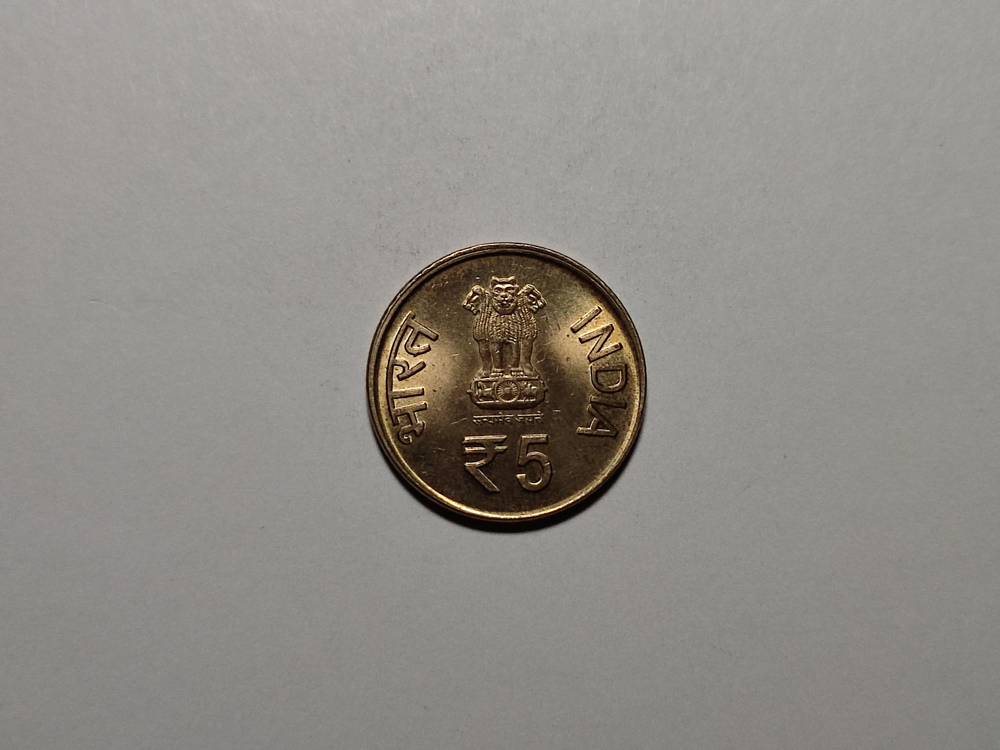

In [4]:
#Looking at an example image (Raw)
image = Image.open('/content/dataset/training_set/five/Five_106.jpg')
display(image)

**Initial Remarks:**

The intial size of the image is very lagre 4000 x 3000 = 12000000 i.e 12MP, to fed images in a CNN we need to reduce the size. While altering the size of images it should be ensured that the aspect ratio of the images remains same so that the shape of the object captured in the image is not distorted.

The Size of the Raw Images without Resizing: (4000, 3000)

Resized Image:-



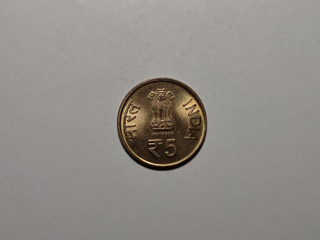


The Size of the Input Images after Resizing: (320, 240)


In [5]:
#Size of the image
print('The Size of the Raw Images without Resizing: {}\n\nResized Image:-\n'.format(image.size))

factor = 12.5 # Size Reduction Factor
size = image.size[0] / factor
image.thumbnail((size,size)) #The thumnail method of the PIL.Image object ensures that aspect ratio is preserved while reszing.

display(image)

target_hieght, target_width = image.size #Extracting Target Size

print('\nThe Size of the Input Images after Resizing: {}'.format(image.size))

In [6]:
#Data Augmentation and Pre-Processing

train_datagen = ImageDataGenerator(rescale = 1./255, 
                                   rotation_range=90,  
                                   shear_range = 0.2, 
                                   zoom_range = 0.2, 
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

#Training Set
training_set = train_datagen.flow_from_directory('dataset/training_set', 
                                                 target_size = (240, 320), 
                                                 batch_size = 32, 
                                                 class_mode='categorical')

#Test Set
test_set = test_datagen.flow_from_directory('dataset/test_Set', 
                                            target_size = (240, 320), 
                                            batch_size = 32, 
                                            class_mode = 'categorical')

Found 720 images belonging to 5 classes.
Found 180 images belonging to 5 classes.


## Developing the CNN Architecture

The model developed in this study is a non - binary Sequential type model. Hence, in the final layer of the network a **'Softmax'** activation function is applied since the model tries predict a multinomial probability distribution (more than two prediction classes).

### Network Parameters:
1. Rectifier Linear Unit
2. Adam optimizer
3. Softmax on Final output
4. Categorical CrossEntropy loss

In [7]:
#CNN Architecture
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPool2D
from keras.layers import Flatten, GlobalAvgPool2D
from keras.layers import Dense
from tensorflow.keras.optimizers import Adam
model = Sequential()

# CNN network
model.add( Conv2D(16, 3, activation='relu', padding='same', input_shape=(target_width, target_hieght, 3)) )
model.add( MaxPool2D(2) )

model.add( Conv2D(32, 3, activation='relu', padding='same') )
model.add( MaxPool2D(2) )

model.add( Conv2D(64, 3, activation='relu', padding='same') )
model.add( MaxPool2D(2) )

model.add( Conv2D(128, 3, activation='relu', padding='same') )
model.add( MaxPool2D(2) )

model.add( Conv2D(256, 3, activation='relu', padding='same') )

# Transition between CNN and MLP
model.add( GlobalAvgPool2D() )

# MLP network
model.add( Dense(256, activation='relu') )

model.add( Dense(5, activation='softmax') )

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 240, 320, 16)      448       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 120, 160, 16)      0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 120, 160, 32)      4640      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 60, 80, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 60, 80, 64)        18496     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 30, 40, 64)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 30, 40, 128)       7

## Training 

In [8]:
#Setting up Training Scheme
optm = Adam(learning_rate = 1e-3) #Loss fuction

model.compile(optimizer = optm, loss = 'categorical_crossentropy', metrics = ['acc']) 

#Setting Up callbacks
from keras.callbacks import ReduceLROnPlateau, ModelCheckpoint, EarlyStopping

callbacks = [
    ReduceLROnPlateau(patience=5, factor=0.1, verbose=True),
    ModelCheckpoint('best_model', save_best_only=True),
]

In [9]:
#Training 
history = model.fit(training_set, 
                    epochs=100, 
                    validation_data = test_set, 
                    batch_size=32, 
                    verbose = 0,
                    callbacks = callbacks);

In [10]:
df_history = pd.DataFrame(history.history)

max_val_acc = df_history['val_acc'].max()
index = df_history[df_history['val_acc'] == max_val_acc].index
_, train_loss, train_acc, val_loss, _, _ = [k for k in df_history.iloc[index[0]]]

# Printing the Best Results
print('Best Validation Scores:\n')
print('Validation_Accuracy : {}'.format(max_val_acc))
print('Validation_Loss : {}'.format(val_loss))
print('Training_Accuracy : {}'.format(train_acc))
print('Training_Loss : {}'.format(train_loss))

#Saving CSV
df_history.to_csv('History_Data.csv')

Best Validation Scores:

Validation_Accuracy : 0.90626259
Validation_Loss : 0.25226969
Training_Accuracy : 0.913814902
Training_Loss : 0.25426969


## Results:

The Validation Accuracy of the model : **90.63%**

The Training Accuracy of the model : **91.38%**

For detailed model evaluation see this notebook

For detailed convolution layer study see this notebook. 